In [1]:
!mkdir -p aea_sample_data
!mkdir -p aea_sample_data/loc1_script2_seq1_rec1_10s_sample,
!curl -o aea_sample_data/aea_sample_data_rec1.zip -C - -O -L "https://www.projectaria.com/async/sample/download/?bucket=aea&filename=loc1_script2_seq1_rec1_10s_sample.zip"
!unzip -o aea_sample_data/aea_sample_data_rec1.zip -d aea_sample_data/loc1_script2_seq1_rec1_10s_sample

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  204M  100  204M    0     0  10.0M      0  0:00:20  0:00:20 --:--:-- 11.0M
Archive:  aea_sample_data/aea_sample_data_rec1.zip
  inflating: aea_sample_data/loc1_script2_seq1_rec1_10s_sample/metadata.json  
   creating: aea_sample_data/loc1_script2_seq1_rec1_10s_sample/mps/
   creating: aea_sample_data/loc1_script2_seq1_rec1_10s_sample/mps/eye_gaze/
  inflating: aea_sample_data/loc1_script2_seq1_rec1_10s_sample/mps/eye_gaze/general_eye_gaze.csv  
  inflating: aea_sample_data/loc1_script2_seq1_rec1_10s_sample/mps/eye_gaze/summary.json  
   creating: aea_sample_data/loc1_script2_seq1_rec1_10s_sample/mps/slam/
  inflating: aea_sample_data/loc1_script2_seq1_rec1_10s_sample/mps/slam/closed_loop_trajectory.csv  
  inflating: aea_sample_data/loc1_script2_seq

In [2]:
import os
import numpy as np
from projectaria_tools.projects.aea import (
    AriaEverydayActivitiesDataPathsProvider, 
    AriaEverydayActivitiesDataProvider)
from projectaria_tools.core.stream_id import StreamId
from projectaria_tools.core.sensor_data import TimeDomain, TimeQueryOptions

from PIL import Image
from IPython.display import Audio

In [3]:
seq_path = "/tmp/aea_sample_data/loc1_script2_seq1_rec1_10s_sample"
aea_paths_provider_1 = AriaEverydayActivitiesDataPathsProvider(seq_path)
aea_data_provider_1 = AriaEverydayActivitiesDataProvider(seq_path)
concurrent_recording_filename = aea_paths_provider_1.get_concurrent_recordings()
concurrent_sequence_path = os.path.join(os.path.dirname(seq_path), concurrent_recording_filename[0])
timecode_vec = aea_data_provider_1.vrs.get_timestamps_ns(StreamId("214-1"), TimeDomain.TIME_CODE)
device_time_ns = [aea_data_provider_1.vrs.convert_from_timecode_to_device_time_ns(t) for t in timecode_vec]

[MultiRecordFileReader][DEBUG]: Opened file '/tmp/aea_sample_data/loc1_script2_seq1_rec1_10s_sample/recording.vrs' and assigned to reader #0
[VrsDataProvider][INFO]: streamId 211-1/camera-et activated
[VrsDataProvider][INFO]: streamId 214-1/camera-rgb activated
[VrsDataProvider][INFO]: streamId 231-1/mic activated
[VrsDataProvider][INFO]: streamId 247-1/baro0 activated
[VrsDataProvider][INFO]: Timecode stream found: 285-1
[VrsDataProvider][INFO]: streamId 1201-1/camera-slam-left activated
[VrsDataProvider][INFO]: streamId 1201-2/camera-slam-right activated
[VrsDataProvider][INFO]: streamId 1202-1/imu-right activated
[VrsDataProvider][INFO]: streamId 1202-2/imu-left activated
[VrsDataProvider][INFO]: streamId 1203-1/mag0 activated


In [4]:
image = []
audio = []

for t in device_time_ns:
    image.append(
        aea_data_provider_1.vrs.get_image_data_by_time_ns(
            StreamId("214-1"),
            t,
            TimeDomain.DEVICE_TIME,
            TimeQueryOptions.BEFORE
        )
    )
    audio.append(
        aea_data_provider_1.vrs.get_audio_data_by_time_ns(
            StreamId("231-1"),
            t,
            TimeDomain.DEVICE_TIME,
            TimeQueryOptions.BEFORE
        )
    )

image.pop(0)
audio.pop(0)

(<_core_pybinds.sensor_data.AudioData at 0x7f7a099dcbb0>,
 <_core_pybinds.sensor_data.AudioDataRecord at 0x7f7a099b94f0>)

In [5]:
%%time
audio_list = [x[0].data[1::7] for x in audio]
cat_audio = np.hstack(audio_list)
Audio(cat_audio,rate=48000)

CPU times: user 143 ms, sys: 15.5 ms, total: 158 ms
Wall time: 156 ms


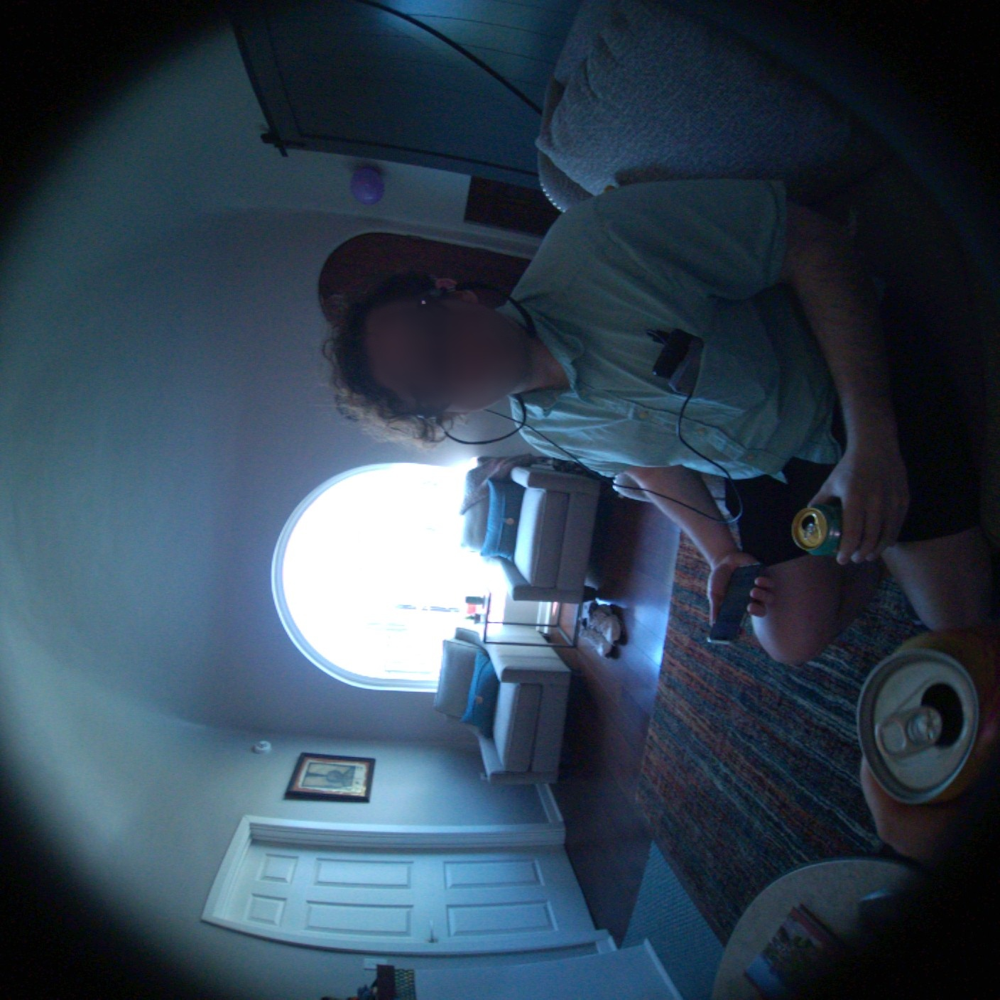

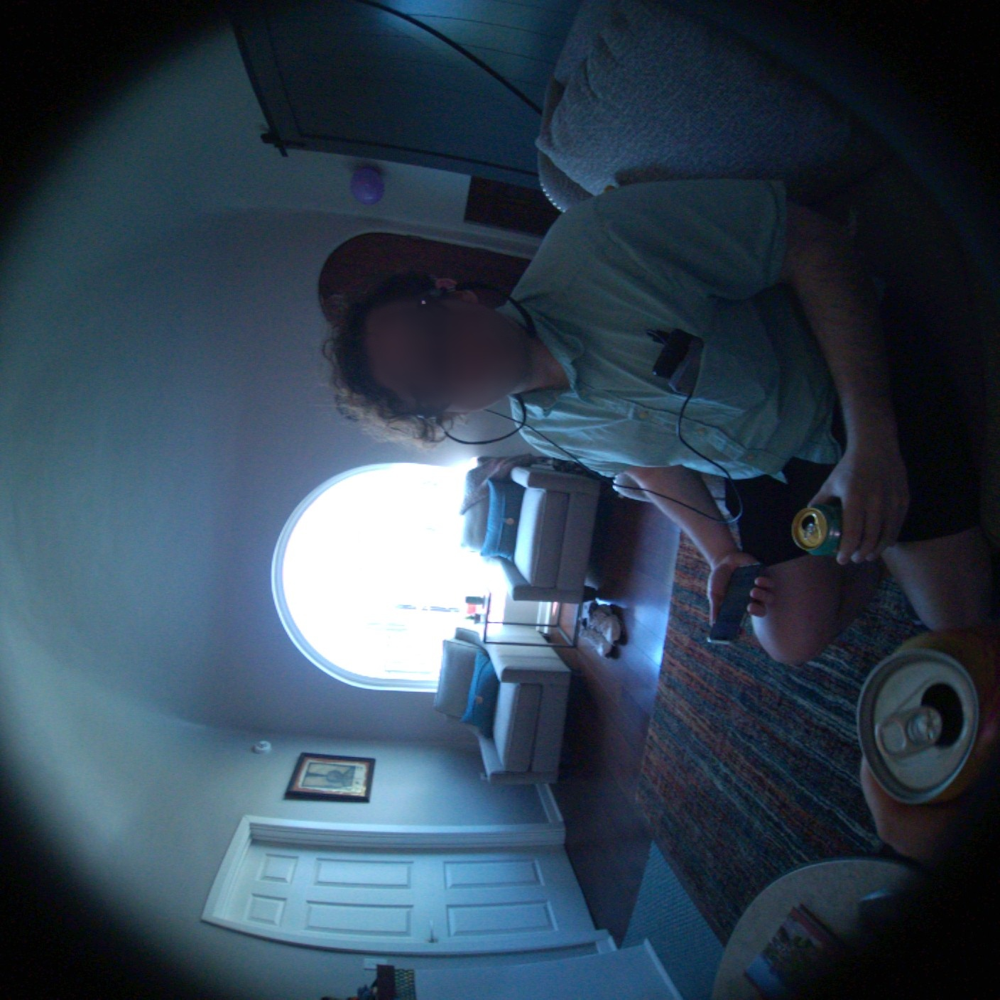

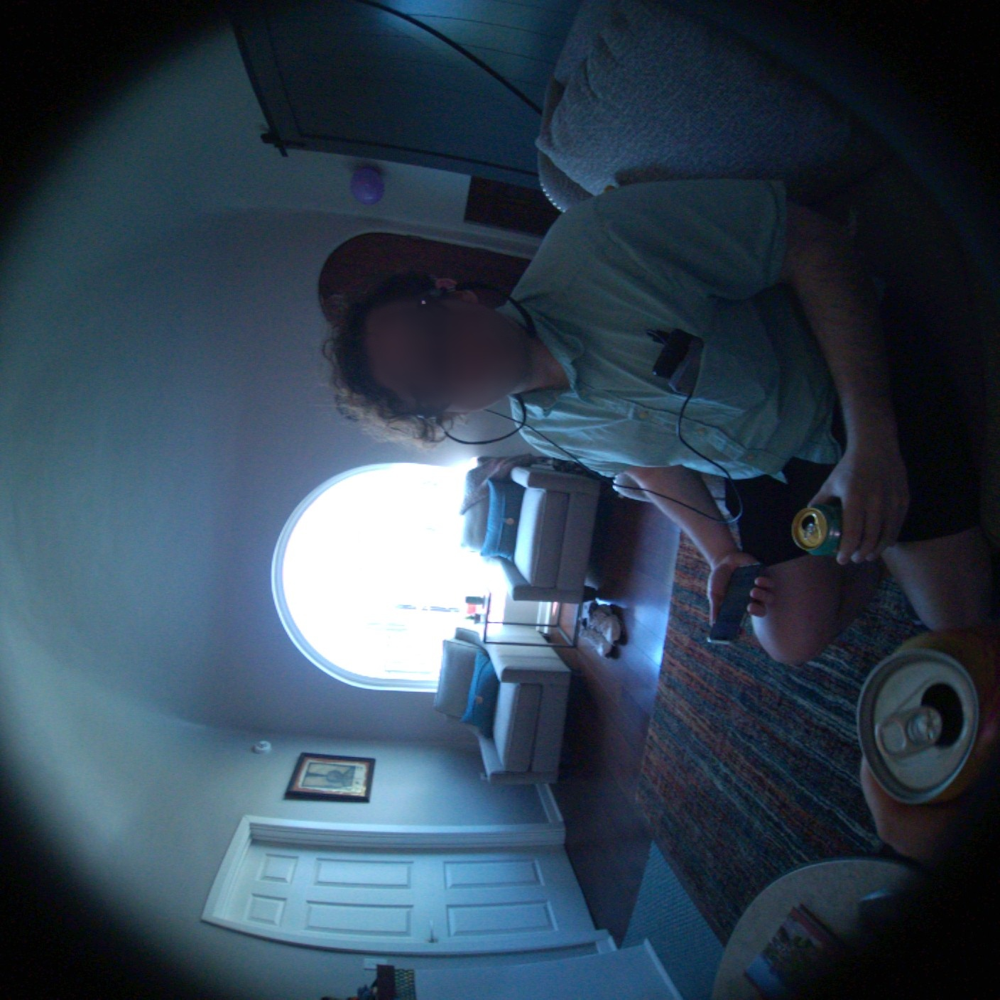

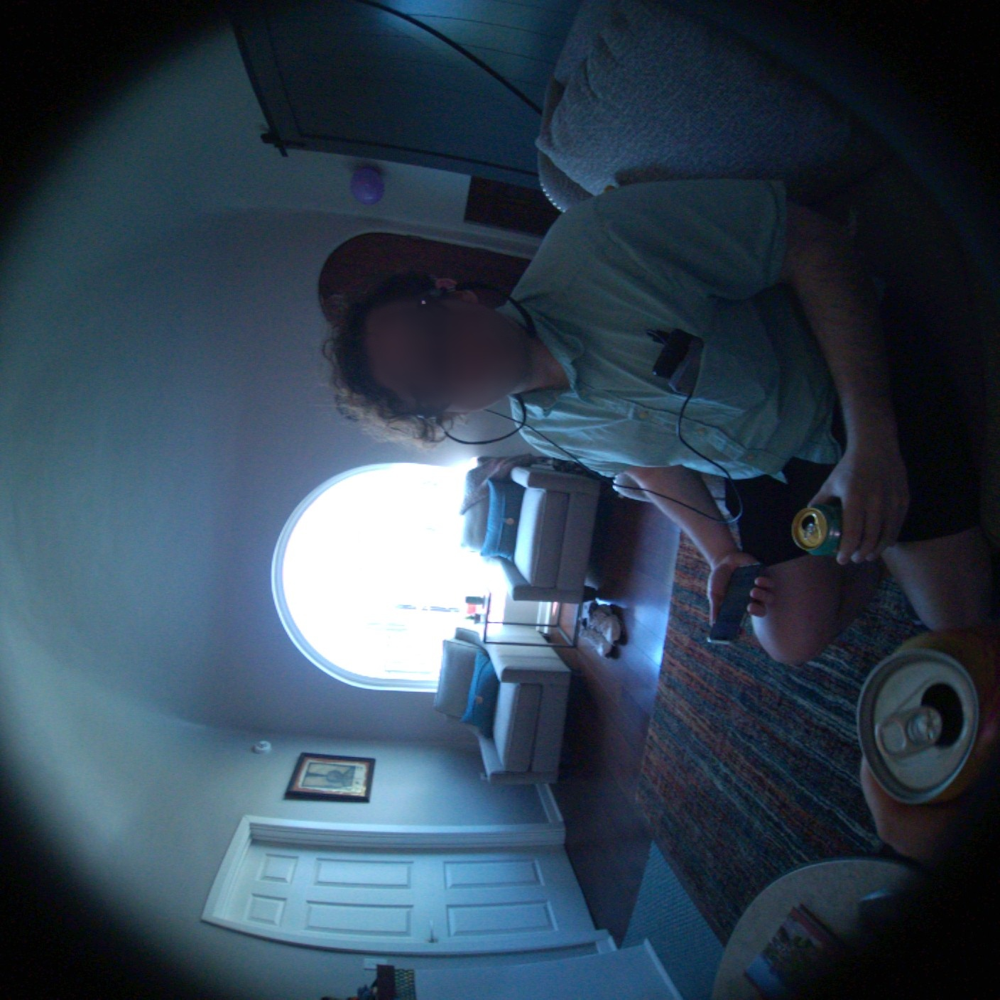

In [6]:
image_list = [Image.fromarray(i[0].to_numpy_array()) for i in image]
for i in image_list[0::50]:
    display(i)